# ASBD Assignment

A. Develop a complete statistical package supporting features for 
   1. Descriptive Analytics
   2. Predictive Analytics

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 

### Importing and understanding the dataset

In [2]:
#importing the dataset
df = pd.read_csv("DataSummary.csv")
df.columns = df.columns.str.replace(' ', '')
df

,ID,Type,Name,Train,Test,Class,Length,ED(w=0),DTW(learned_w),DTW(w=100),Defaultrate,Datadonor/editor
0,1,Image,Adiac,390,391,37,176,0.3887,0.3913 (3),0.3964,0.9591,A. Jalba
1,2,Image,ArrowHead,36,175,3,251,0.2000,0.2000 (0),0.2971,0.6057,L. Ye & E. Keogh
2,3,Spectro,Beef,30,30,5,470,0.3333,0.3333 (0),0.3667,0.8000,K. Kemsley & A. Bagnall
3,4,Image,BeetleFly,20,20,2,512,0.2500,0.3000 (7),0.3000,0.5000,J. Hills & A. Bagnall
4,5,Image,BirdChicken,20,20,2,512,0.4500,0.3000 (6),0.2500,0.5000,J. Hills & A. Bagnall
...,...,...,...,...,...,...,...,...,...,...,...,...
123,124,Spectrum,SemgHandMovementCh2,450,450,6,1500,0.6311,0.3622 (1),0.4156,0.8333,C.-C. M. Yeh
124,125,Spectrum,SemgHandSubjectCh2,450,450,5,1500,0.5956,0.2000 (3),0.2733,0.8000,C.-C. M. Yeh
125,126,Sensor,ShakeGestureWiimoteZ,50,50,10,Vary,0.4000,0.1600 (6),0.1400,0.9000,J. Guna
126,127,Simulated,SmoothSubspace,150,150,3,15,0.0933,0.0533 (1),0.1733,0.6667,X. Huang


In [3]:
# Looking at the first five rows
df.head()

,ID,Type,Name,Train,Test,Class,Length,ED(w=0),DTW(learned_w),DTW(w=100),Defaultrate,Datadonor/editor
0,1,Image,Adiac,390,391,37,176,0.3887,0.3913 (3),0.3964,0.9591,A. Jalba
1,2,Image,ArrowHead,36,175,3,251,0.2000,0.2000 (0),0.2971,0.6057,L. Ye & E. Keogh
2,3,Spectro,Beef,30,30,5,470,0.3333,0.3333 (0),0.3667,0.8000,K. Kemsley & A. Bagnall
3,4,Image,BeetleFly,20,20,2,512,0.2500,0.3000 (7),0.3000,0.5000,J. Hills & A. Bagnall
4,5,Image,BirdChicken,20,20,2,512,0.4500,0.3000 (6),0.2500,0.5000,J. Hills & A. Bagnall


In [4]:
# Looking at the last five rows
df.tail()

,ID,Type,Name,Train,Test,Class,Length,ED(w=0),DTW(learned_w),DTW(w=100),Defaultrate,Datadonor/editor
123,124,Spectrum,SemgHandMovementCh2,450,450,6,1500,0.6311,0.3622 (1),0.4156,0.8333,C.-C. M. Yeh
124,125,Spectrum,SemgHandSubjectCh2,450,450,5,1500,0.5956,0.2000 (3),0.2733,0.8000,C.-C. M. Yeh
125,126,Sensor,ShakeGestureWiimoteZ,50,50,10,Vary,0.4000,0.1600 (6),0.1400,0.9000,J. Guna
126,127,Simulated,SmoothSubspace,150,150,3,15,0.0933,0.0533 (1),0.1733,0.6667,X. Huang
127,128,Simulated,UMD,36,144,3,150,0.2361,0.0278 (6),0.0069,0.6667,Joseph Fourier University


In [5]:
# What type of values are stored in the columns?
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128 entries, 0 to 127
Data columns (total 12 columns):
ID                  128 non-null int64
Type                128 non-null object
Name                128 non-null object
Train               128 non-null int64
Test                128 non-null int64
Class               128 non-null int64
Length              128 non-null object
ED(w=0)             128 non-null float64
DTW(learned_w)      128 non-null object
DTW(w=100)          128 non-null float64
Defaultrate         128 non-null float64
Datadonor/editor    128 non-null object
dtypes: float64(3), int64(4), object(5)
memory usage: 12.1+ KB


In [6]:
# Length column contains missing values (see output of df.tail()--- we can see there is "vary" in length column)
df['Length'] = df['Length'].str.replace(' ','')
df['Length'] = df['Length'].str.replace('Vary','0')
df["Length"] = pd.to_numeric(df["Length"])
df.info() #data type of length is changed



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128 entries, 0 to 127
Data columns (total 12 columns):
ID                  128 non-null int64
Type                128 non-null object
Name                128 non-null object
Train               128 non-null int64
Test                128 non-null int64
Class               128 non-null int64
Length              128 non-null int64
ED(w=0)             128 non-null float64
DTW(learned_w)      128 non-null object
DTW(w=100)          128 non-null float64
Defaultrate         128 non-null float64
Datadonor/editor    128 non-null object
dtypes: float64(3), int64(5), object(4)
memory usage: 12.1+ KB


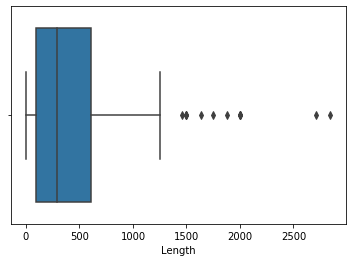

In [7]:
sns.boxplot(df["Length"]) 

Boxplot of length column shows there are outliers present in length column. It is better to replace missing values with median

In [8]:
#replacing missing values in Length column with median
print((df.iloc[:,[6]] == 0).sum())  #there are 11 missing values
df["Length"] = df["Length"].replace(0,np.NaN)
print(df.isnull().sum()) #NaN values in each column
df["Length"].fillna(df["Length"].median(), inplace=True)
df.tail()

Length    11
dtype: int64
ID                   0
Type                 0
Name                 0
Train                0
Test                 0
Class                0
Length              11
ED(w=0)              0
DTW(learned_w)       0
DTW(w=100)           0
Defaultrate          0
Datadonor/editor     0
dtype: int64


,ID,Type,Name,Train,Test,Class,Length,ED(w=0),DTW(learned_w),DTW(w=100),Defaultrate,Datadonor/editor
123,124,Spectrum,SemgHandMovementCh2,450,450,6,1500.0,0.6311,0.3622 (1),0.4156,0.8333,C.-C. M. Yeh
124,125,Spectrum,SemgHandSubjectCh2,450,450,5,1500.0,0.5956,0.2000 (3),0.2733,0.8000,C.-C. M. Yeh
125,126,Sensor,ShakeGestureWiimoteZ,50,50,10,301.0,0.4000,0.1600 (6),0.1400,0.9000,J. Guna
126,127,Simulated,SmoothSubspace,150,150,3,15.0,0.0933,0.0533 (1),0.1733,0.6667,X. Huang
127,128,Simulated,UMD,36,144,3,150.0,0.2361,0.0278 (6),0.0069,0.6667,Joseph Fourier University


In [9]:
# Let's look at some statistical information about our dataframe.
df.describe()

,ID,Train,Test,Class,Length,ED(w=0),DTW(w=100),Defaultrate
count,128.000000,128.000000,128.000000,128.000000,128.000000,128.000000,128.000000,128.000000
mean,64.500000,473.085938,1020.335938,8.734375,516.812500,0.313754,0.272256,0.661984
std,37.094474,1107.392554,2001.825038,12.028499,561.257078,0.203079,0.189050,0.213373
min,1.000000,16.000000,20.000000,2.000000,15.000000,0.000000,0.000000,0.107900
25%,32.750000,53.750000,139.000000,2.000000,144.000000,0.152175,0.134325,0.485650
50%,64.500000,190.500000,316.000000,4.000000,301.000000,0.288050,0.246200,0.666700
75%,96.250000,400.000000,870.750000,10.000000,610.000000,0.434575,0.366175,0.871600
max,128.000000,8926.000000,16800.000000,60.000000,2844.000000,0.942300,0.894200,0.983300


### Step_2: Visualising Data

In [10]:
%matplotlib inline

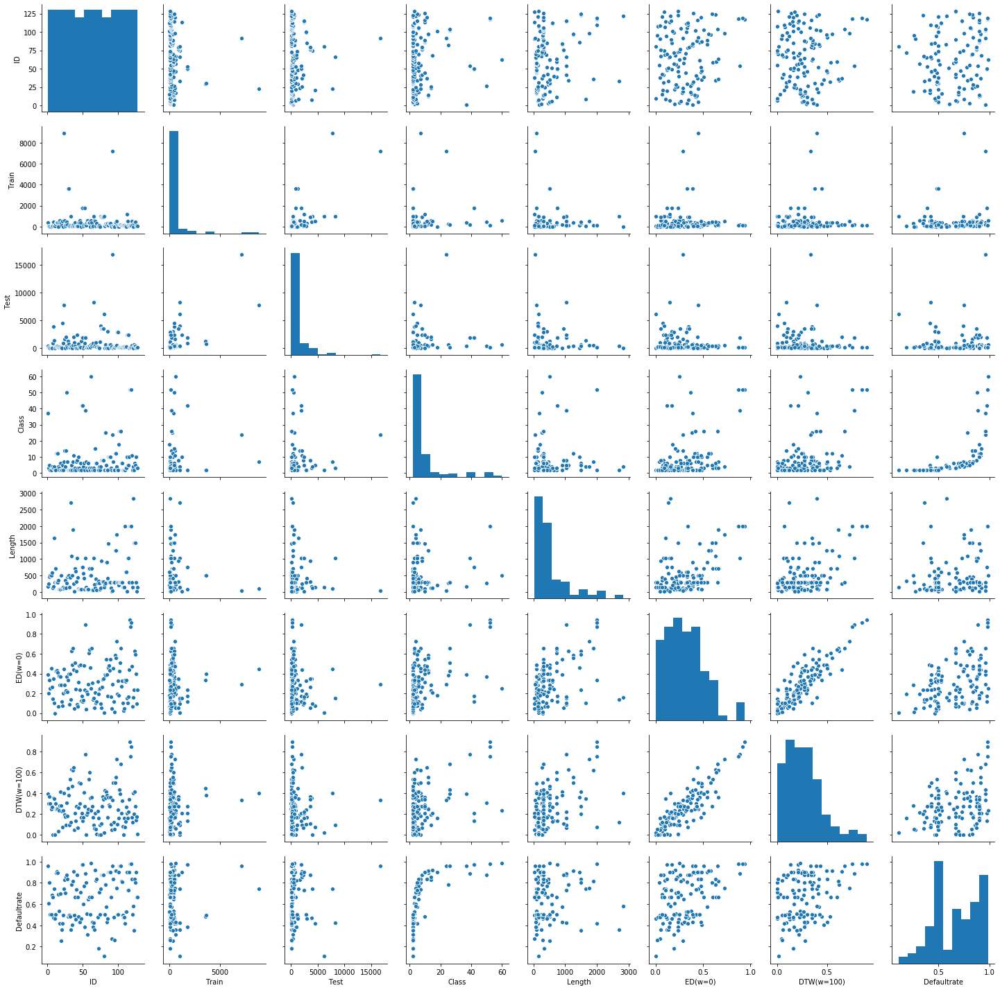

In [11]:
# Let's plot a pair plot of all variables in our dataframe
sns.pairplot(df)

### Inference from pairplot

Euclidean distance (ED) is linearly dependent on DTW, Length (no of columns in dataset) and Deafultrate. 
Which also evident from heatmap (correlation matrix) shown below.

High value implies variables are highly correlated to each other.


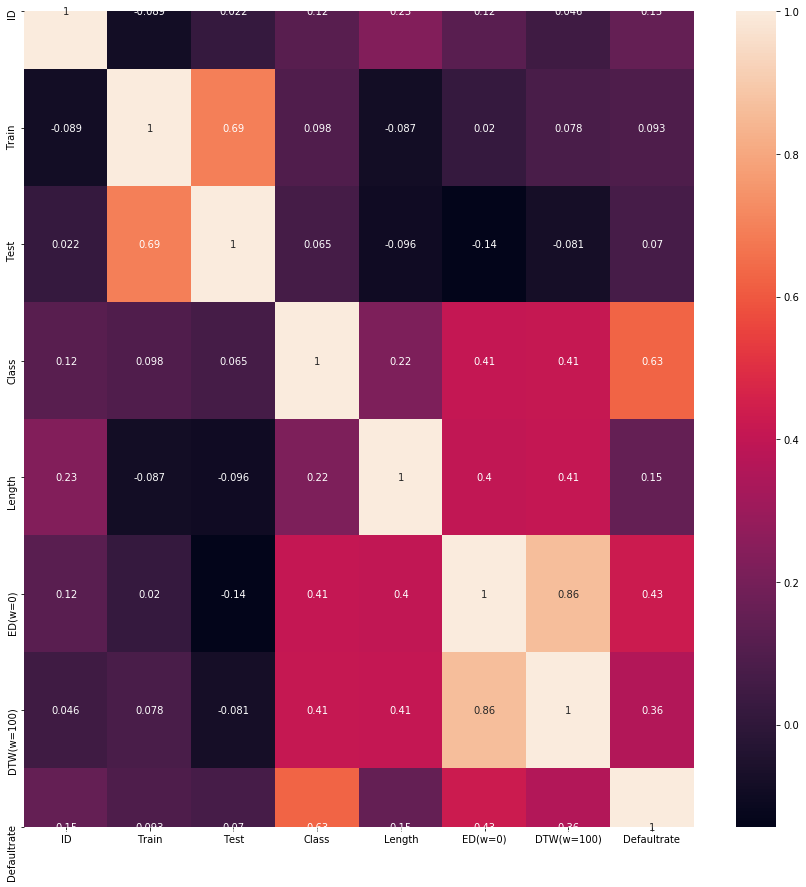

In [12]:
plt.figure(figsize = (15,15))
sns.heatmap(df.corr(),annot=True)

## Predictive analysis

##### Transforming dataset to be used for FIM. 

I am doing the following.

1) Transforming categorical variable (columns names: "Type", "donor") using one-hot encoding. I am thinking of dropping the "Name" column as each value in that column has frequency = 1 which will anyway be eliminated if I keep min_support = 2.

2) Discretizing Error rates columns (which are "ED" stands for euclidean distance, "DTW(w=100)" , "default") . I am thinking to give these names to bins after discretizing: ED_1, ED_2... etc or ED_error_low,  ED_error_high etc. 

3) similarly for other columns. eg for "Train" column -- BIN names would be-- "train_size_small", "train_size_medium", "train_size_large" or "Train_size_A" , "train_size_B"... 

The inference (rules after pattern generation) I am expecting to get:
1) If type == name then most likely data donor would be { J. Hills & A. Bagnall}
2) if (ED == ED_error_low && Train_size == Small) then most likely type would be {"Image" }

In [13]:
#transforming categorical variable

# Creating a dummy variable for 'Type'
status = pd.get_dummies(df['Type'])

In [14]:
# The result has created 15 variables 
status.head()

,Device,ECG,EOG,EPG,HRM,Hemodynamics,Image,Motion,Power,Sensor,Simulated,Spectro,Spectrum,Traffic,Trajectory
0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [15]:
#Adding the results to the master dataframe
df = pd.concat([df,status],axis=1)

In [16]:
df.head()

,ID,Type,Name,Train,Test,Class,Length,ED(w=0),DTW(learned_w),DTW(w=100),...,Hemodynamics,Image,Motion,Power,Sensor,Simulated,Spectro,Spectrum,Traffic,Trajectory
0,1,Image,Adiac,390,391,37,176.0,0.3887,0.3913 (3),0.3964,...,0,1,0,0,0,0,0,0,0,0
1,2,Image,ArrowHead,36,175,3,251.0,0.2000,0.2000 (0),0.2971,...,0,1,0,0,0,0,0,0,0,0
2,3,Spectro,Beef,30,30,5,470.0,0.3333,0.3333 (0),0.3667,...,0,0,0,0,0,0,1,0,0,0
3,4,Image,BeetleFly,20,20,2,512.0,0.2500,0.3000 (7),0.3000,...,0,1,0,0,0,0,0,0,0,0
4,5,Image,BirdChicken,20,20,2,512.0,0.4500,0.3000 (6),0.2500,...,0,1,0,0,0,0,0,0,0,0


In [17]:
# Dropping type as we have created the dummies for it
df.drop(['Type'],axis=1,inplace=True)

In [18]:
# Now let's see the head of our dataframe.
df.head()

,ID,Name,Train,Test,Class,Length,ED(w=0),DTW(learned_w),DTW(w=100),Defaultrate,...,Hemodynamics,Image,Motion,Power,Sensor,Simulated,Spectro,Spectrum,Traffic,Trajectory
0,1,Adiac,390,391,37,176.0,0.3887,0.3913 (3),0.3964,0.9591,...,0,1,0,0,0,0,0,0,0,0
1,2,ArrowHead,36,175,3,251.0,0.2000,0.2000 (0),0.2971,0.6057,...,0,1,0,0,0,0,0,0,0,0
2,3,Beef,30,30,5,470.0,0.3333,0.3333 (0),0.3667,0.8000,...,0,0,0,0,0,0,1,0,0,0
3,4,BeetleFly,20,20,2,512.0,0.2500,0.3000 (7),0.3000,0.5000,...,0,1,0,0,0,0,0,0,0,0
4,5,BirdChicken,20,20,2,512.0,0.4500,0.3000 (6),0.2500,0.5000,...,0,1,0,0,0,0,0,0,0,0


In [19]:
#transforming categorical variable

# Creating a dummy variable for 'Datadonor/editor'
status = pd.get_dummies(df['Datadonor/editor'])

In [20]:
# The result has created 64 variables 
status.head()

,A. Bagnall,A. Bagnall & J. Lines,A. Bagnall & J. Liu,"A. Bagnall, L. Ye & E. Keogh",A. Gandhi,A. Jalba,A. Mueen & E. Keogh,A. Ratanamahatana & E. Keogh,ADIAC project,C. Guestrin & J. Sun,...,T. Rath & R. Manmatha,W. Fonzi,X. Huang,X. Xi & E. Keogh,Y. Chen & E. Keogh,Y. Zhu,physionet.org,physionet.org & E. Keogh,"physionet.org, B. Hu & E. Keogh","physionet.org, Y. Chen & E. Keogh"
0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [21]:
#Adding the results to the master dataframe
df = pd.concat([df,status],axis=1)

In [22]:
# Now let's see the head of our dataframe.
df.head()

,ID,Name,Train,Test,Class,Length,ED(w=0),DTW(learned_w),DTW(w=100),Defaultrate,...,T. Rath & R. Manmatha,W. Fonzi,X. Huang,X. Xi & E. Keogh,Y. Chen & E. Keogh,Y. Zhu,physionet.org,physionet.org & E. Keogh,"physionet.org, B. Hu & E. Keogh","physionet.org, Y. Chen & E. Keogh"
0,1,Adiac,390,391,37,176.0,0.3887,0.3913 (3),0.3964,0.9591,...,0,0,0,0,0,0,0,0,0,0
1,2,ArrowHead,36,175,3,251.0,0.2000,0.2000 (0),0.2971,0.6057,...,0,0,0,0,0,0,0,0,0,0
2,3,Beef,30,30,5,470.0,0.3333,0.3333 (0),0.3667,0.8000,...,0,0,0,0,0,0,0,0,0,0
3,4,BeetleFly,20,20,2,512.0,0.2500,0.3000 (7),0.3000,0.5000,...,0,0,0,0,0,0,0,0,0,0
4,5,BirdChicken,20,20,2,512.0,0.4500,0.3000 (6),0.2500,0.5000,...,0,0,0,0,0,0,0,0,0,0


In [23]:
# Dropping datadonor as we have created the dummies for it
df.drop(['Datadonor/editor'],axis=1,inplace=True)

In [24]:
df.head()

,ID,Name,Train,Test,Class,Length,ED(w=0),DTW(learned_w),DTW(w=100),Defaultrate,...,T. Rath & R. Manmatha,W. Fonzi,X. Huang,X. Xi & E. Keogh,Y. Chen & E. Keogh,Y. Zhu,physionet.org,physionet.org & E. Keogh,"physionet.org, B. Hu & E. Keogh","physionet.org, Y. Chen & E. Keogh"
0,1,Adiac,390,391,37,176.0,0.3887,0.3913 (3),0.3964,0.9591,...,0,0,0,0,0,0,0,0,0,0
1,2,ArrowHead,36,175,3,251.0,0.2000,0.2000 (0),0.2971,0.6057,...,0,0,0,0,0,0,0,0,0,0
2,3,Beef,30,30,5,470.0,0.3333,0.3333 (0),0.3667,0.8000,...,0,0,0,0,0,0,0,0,0,0
3,4,BeetleFly,20,20,2,512.0,0.2500,0.3000 (7),0.3000,0.5000,...,0,0,0,0,0,0,0,0,0,0
4,5,BirdChicken,20,20,2,512.0,0.4500,0.3000 (6),0.2500,0.5000,...,0,0,0,0,0,0,0,0,0,0


## Transforming continuous variables using discretisation

In [25]:
#discretising Train column and assigning label
cut_labels_4 = ['Train_low', 'Train_medium', 'Train_high', 'Train_extremely_high']
df['Train_binned'] = pd.cut(df['Train'], bins=4, labels = cut_labels_4)

In [26]:
#values in each bin
pd.cut(df['Train'], bins=4).value_counts()

(7.09, 2243.5]      124
(6698.5, 8926.0]      2
(2243.5, 4471.0]      2
(4471.0, 6698.5]      0
Name: Train, dtype: int64

In [27]:
#creating dummy variable for Trained_binned column just like Type column
#ie transforming categorical variable
status = pd.get_dummies(df['Train_binned'])

In [28]:
# The result has created 4 variables 
status.head()

Train_binned,Train_low,Train_medium,Train_high,Train_extremely_high
0,1,0,0,0
1,1,0,0,0
2,1,0,0,0
3,1,0,0,0
4,1,0,0,0


In [29]:
#Adding the results to the master dataframe
df = pd.concat([df,status],axis=1)

In [30]:
# Now let's see the head of our dataframe.
df.head()

,ID,Name,Train,Test,Class,Length,ED(w=0),DTW(learned_w),DTW(w=100),Defaultrate,...,Y. Zhu,physionet.org,physionet.org & E. Keogh,"physionet.org, B. Hu & E. Keogh","physionet.org, Y. Chen & E. Keogh",Train_binned,Train_low,Train_medium,Train_high,Train_extremely_high
0,1,Adiac,390,391,37,176.0,0.3887,0.3913 (3),0.3964,0.9591,...,0,0,0,0,0,Train_low,1,0,0,0
1,2,ArrowHead,36,175,3,251.0,0.2000,0.2000 (0),0.2971,0.6057,...,0,0,0,0,0,Train_low,1,0,0,0
2,3,Beef,30,30,5,470.0,0.3333,0.3333 (0),0.3667,0.8000,...,0,0,0,0,0,Train_low,1,0,0,0
3,4,BeetleFly,20,20,2,512.0,0.2500,0.3000 (7),0.3000,0.5000,...,0,0,0,0,0,Train_low,1,0,0,0
4,5,BirdChicken,20,20,2,512.0,0.4500,0.3000 (6),0.2500,0.5000,...,0,0,0,0,0,Train_low,1,0,0,0


In [31]:
# Dropping Train as we have created the dummies for it
df.drop(['Train'],axis=1,inplace=True)
df.drop(['Train_binned'],axis=1,inplace=True)

In [32]:
df.head()

,ID,Name,Test,Class,Length,ED(w=0),DTW(learned_w),DTW(w=100),Defaultrate,Device,...,Y. Chen & E. Keogh,Y. Zhu,physionet.org,physionet.org & E. Keogh,"physionet.org, B. Hu & E. Keogh","physionet.org, Y. Chen & E. Keogh",Train_low,Train_medium,Train_high,Train_extremely_high
0,1,Adiac,391,37,176.0,0.3887,0.3913 (3),0.3964,0.9591,0,...,0,0,0,0,0,0,1,0,0,0
1,2,ArrowHead,175,3,251.0,0.2000,0.2000 (0),0.2971,0.6057,0,...,0,0,0,0,0,0,1,0,0,0
2,3,Beef,30,5,470.0,0.3333,0.3333 (0),0.3667,0.8000,0,...,0,0,0,0,0,0,1,0,0,0
3,4,BeetleFly,20,2,512.0,0.2500,0.3000 (7),0.3000,0.5000,0,...,0,0,0,0,0,0,1,0,0,0
4,5,BirdChicken,20,2,512.0,0.4500,0.3000 (6),0.2500,0.5000,0,...,0,0,0,0,0,0,1,0,0,0


In [33]:
#similarly do for other continous variables

#discretising Test column and assigning label
cut_labels_4 = ['Test_low', 'Test_medium', 'Test_high', 'Test_extremely_high']
df['Test_binned'] = pd.cut(df['Test'], bins=4, labels = cut_labels_4)

# #values in each bin
print("\n Values in each bin of Test column: \n", pd.cut(df['Test'], bins=4).value_counts())

#creating dummy variable for Test_binned column just like Type column
#ie transforming categorical variable
status = pd.get_dummies(df['Test_binned'])
# The result has created 4 variables 
#Adding the results to the master dataframe
df = pd.concat([df,status],axis=1)

# Dropping Testbinned as we have created the dummies for it
df.drop(['Test'],axis=1,inplace=True)
df.drop(['Test_binned'],axis=1,inplace=True)
df.head()


 Values in each bin of Test column: 
 (3.22, 4215.0]        123
(4215.0, 8410.0]        4
(12605.0, 16800.0]      1
(8410.0, 12605.0]       0
Name: Test, dtype: int64


,ID,Name,Class,Length,ED(w=0),DTW(learned_w),DTW(w=100),Defaultrate,Device,ECG,...,"physionet.org, B. Hu & E. Keogh","physionet.org, Y. Chen & E. Keogh",Train_low,Train_medium,Train_high,Train_extremely_high,Test_low,Test_medium,Test_high,Test_extremely_high
0,1,Adiac,37,176.0,0.3887,0.3913 (3),0.3964,0.9591,0,0,...,0,0,1,0,0,0,1,0,0,0
1,2,ArrowHead,3,251.0,0.2000,0.2000 (0),0.2971,0.6057,0,0,...,0,0,1,0,0,0,1,0,0,0
2,3,Beef,5,470.0,0.3333,0.3333 (0),0.3667,0.8000,0,0,...,0,0,1,0,0,0,1,0,0,0
3,4,BeetleFly,2,512.0,0.2500,0.3000 (7),0.3000,0.5000,0,0,...,0,0,1,0,0,0,1,0,0,0
4,5,BirdChicken,2,512.0,0.4500,0.3000 (6),0.2500,0.5000,0,0,...,0,0,1,0,0,0,1,0,0,0


In [34]:
#discretising Class column and assigning label
cut_labels_4 = ['Class_low', 'Class_medium', 'Class_high', 'Class_extremely_high']
df['Class_binned'] = pd.cut(df['Class'], bins=4, labels = cut_labels_4)

# #values in each bin
print("\n Values in each bin of Class column: \n", pd.cut(df['Class'], bins=4).value_counts())

#creating dummy variable for Test_binned column just like Type column
#ie transforming categorical variable
status = pd.get_dummies(df['Class_binned'])
# The result has created 4 variables 
#Adding the results to the master dataframe
df = pd.concat([df,status],axis=1)

# Dropping Testbinned as we have created the dummies for it
df.drop(['Class'],axis=1,inplace=True)
df.drop(['Class_binned'],axis=1,inplace=True)
df.head()


 Values in each bin of Class column: 
 (1.942, 16.5]    113
(16.5, 31.0]       6
(45.5, 60.0]       5
(31.0, 45.5]       4
Name: Class, dtype: int64


,ID,Name,Length,ED(w=0),DTW(learned_w),DTW(w=100),Defaultrate,Device,ECG,EOG,...,Train_high,Train_extremely_high,Test_low,Test_medium,Test_high,Test_extremely_high,Class_low,Class_medium,Class_high,Class_extremely_high
0,1,Adiac,176.0,0.3887,0.3913 (3),0.3964,0.9591,0,0,0,...,0,0,1,0,0,0,0,0,1,0
1,2,ArrowHead,251.0,0.2000,0.2000 (0),0.2971,0.6057,0,0,0,...,0,0,1,0,0,0,1,0,0,0
2,3,Beef,470.0,0.3333,0.3333 (0),0.3667,0.8000,0,0,0,...,0,0,1,0,0,0,1,0,0,0
3,4,BeetleFly,512.0,0.2500,0.3000 (7),0.3000,0.5000,0,0,0,...,0,0,1,0,0,0,1,0,0,0
4,5,BirdChicken,512.0,0.4500,0.3000 (6),0.2500,0.5000,0,0,0,...,0,0,1,0,0,0,1,0,0,0


In [35]:
#discretising Length column and assigning label
cut_labels_4 = ['Length_low', 'Length_medium', 'Length_high', 'Length_extremely_high']
df['Length_binned'] = pd.cut(df['Length'], bins=4, labels = cut_labels_4)

# #values in each bin
print("\n Values in each bin of Length column: \n", pd.cut(df['Length'], bins=4).value_counts())

#creating dummy variable for Test_binned column just like Type column
#ie transforming categorical variable
status = pd.get_dummies(df['Length_binned'])
# The result has created 4 variables 
#Adding the results to the master dataframe
df = pd.concat([df,status],axis=1)

# Dropping Testbinned as we have created the dummies for it
df.drop(['Length'],axis=1,inplace=True)
df.drop(['Length_binned'],axis=1,inplace=True)
df.head()


 Values in each bin of Length column: 
 (12.171, 722.25]     102
(722.25, 1429.5]      13
(1429.5, 2136.75]     11
(2136.75, 2844.0]      2
Name: Length, dtype: int64


,ID,Name,ED(w=0),DTW(learned_w),DTW(w=100),Defaultrate,Device,ECG,EOG,EPG,...,Test_high,Test_extremely_high,Class_low,Class_medium,Class_high,Class_extremely_high,Length_low,Length_medium,Length_high,Length_extremely_high
0,1,Adiac,0.3887,0.3913 (3),0.3964,0.9591,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
1,2,ArrowHead,0.2000,0.2000 (0),0.2971,0.6057,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
2,3,Beef,0.3333,0.3333 (0),0.3667,0.8000,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
3,4,BeetleFly,0.2500,0.3000 (7),0.3000,0.5000,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
4,5,BirdChicken,0.4500,0.3000 (6),0.2500,0.5000,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0


In [36]:
#discretising ED(w=0) column and assigning label
cut_labels_4 = ['ED_low', 'ED_medium', 'ED_high', 'ED_extremely_high']
df['ED_binned'] = pd.cut(df['ED(w=0)'], bins=4, labels = cut_labels_4)

# #values in each bin
print("\n Values in each bin of ED column: \n", pd.cut(df['ED(w=0)'], bins=4).value_counts())

#creating dummy variable for Test_binned column just like Type column
#ie transforming categorical variable
status = pd.get_dummies(df['ED_binned'])
# The result has created 4 variables 
#Adding the results to the master dataframe
df = pd.concat([df,status],axis=1)

# Dropping Testbinned as we have created the dummies for it
df.drop(['ED(w=0)'],axis=1,inplace=True)
df.drop(['ED_binned'],axis=1,inplace=True)
df.head()


 Values in each bin of ED column: 
 (0.236, 0.471]        53
(-0.000942, 0.236]    50
(0.471, 0.707]        20
(0.707, 0.942]         5
Name: ED(w=0), dtype: int64


,ID,Name,DTW(learned_w),DTW(w=100),Defaultrate,Device,ECG,EOG,EPG,HRM,...,Class_high,Class_extremely_high,Length_low,Length_medium,Length_high,Length_extremely_high,ED_low,ED_medium,ED_high,ED_extremely_high
0,1,Adiac,0.3913 (3),0.3964,0.9591,0,0,0,0,0,...,1,0,1,0,0,0,0,1,0,0
1,2,ArrowHead,0.2000 (0),0.2971,0.6057,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
2,3,Beef,0.3333 (0),0.3667,0.8000,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
3,4,BeetleFly,0.3000 (7),0.3000,0.5000,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
4,5,BirdChicken,0.3000 (6),0.2500,0.5000,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


In [37]:
#discretising DTW column and assigning label
cut_labels_4 = ['DTW_low', 'DTW_medium', 'DTW_high', 'DTW_extremely_high']
df['DTW_binned'] = pd.cut(df['DTW(w=100)'], bins=4, labels = cut_labels_4)

#values in each bin
print("\n Values in each bin of DTW column: \n", pd.cut(df['DTW(w=100)'], bins=4).value_counts())

#creating dummy variable for Test_binned column just like Type column
#ie transforming categorical variable
status = pd.get_dummies(df['DTW_binned'])

# The result has created 4 variables 
#Adding the results to the master dataframe
df = pd.concat([df,status],axis=1)

# Dropping Testbinned as we have created the dummies for it
df.drop(['DTW(w=100)'],axis=1,inplace=True)
df.drop(['DTW_binned'],axis=1,inplace=True)
df.drop(['DTW(learned_w)'],axis=1,inplace=True)

df.head()




 Values in each bin of DTW column: 
 (-0.000894, 0.224]    56
(0.224, 0.447]        54
(0.447, 0.671]        12
(0.671, 0.894]         6
Name: DTW(w=100), dtype: int64


,ID,Name,Defaultrate,Device,ECG,EOG,EPG,HRM,Hemodynamics,Image,...,Length_high,Length_extremely_high,ED_low,ED_medium,ED_high,ED_extremely_high,DTW_low,DTW_medium,DTW_high,DTW_extremely_high
0,1,Adiac,0.9591,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0
1,2,ArrowHead,0.6057,0,0,0,0,0,0,1,...,0,0,1,0,0,0,0,1,0,0
2,3,Beef,0.8000,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,4,BeetleFly,0.5000,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0
4,5,BirdChicken,0.5000,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0


In [38]:
#discretising Defaultrate column and assigning label
cut_labels_4 = ['Defaultrate_low', 'Defaultrate_medium', 'Defaultrate_high', 'Defaultrate_extremely_high']
df['Defaultrate_binned'] = pd.cut(df['Defaultrate'], bins=4, labels = cut_labels_4)

#values in each bin
print("\n Values in each bin of Defaultrate column: \n", pd.cut(df['Defaultrate'], bins=4).value_counts())

#creating dummy variable for Test_binned column just like Type column
#ie transforming categorical variable
status = pd.get_dummies(df['Defaultrate_binned'])

# The result has created 4 variables 
#Adding the results to the master dataframe
df = pd.concat([df,status],axis=1)

# Dropping Testbinned as we have created the dummies for it
df.drop(['Defaultrate'],axis=1,inplace=True)
df.drop(['Defaultrate_binned'],axis=1,inplace=True)
df.head()




 Values in each bin of Defaultrate column: 
 (0.764, 0.983]    50
(0.327, 0.546]    45
(0.546, 0.764]    27
(0.107, 0.327]     6
Name: Defaultrate, dtype: int64


,ID,Name,Device,ECG,EOG,EPG,HRM,Hemodynamics,Image,Motion,...,ED_high,ED_extremely_high,DTW_low,DTW_medium,DTW_high,DTW_extremely_high,Defaultrate_low,Defaultrate_medium,Defaultrate_high,Defaultrate_extremely_high
0,1,Adiac,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,1
1,2,ArrowHead,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,1,0
2,3,Beef,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
3,4,BeetleFly,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,1,0,0
4,5,BirdChicken,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,1,0,0


In [39]:
#creating dummy variable for Name column just like Type column
df1 = df.copy()
#ie transforming categorical variable
status = pd.get_dummies(df['Name'])

# The result has created 4 variables 
#Adding the results to the master dataframe
df1 = pd.concat([df1,status],axis=1)

# Dropping Testbinned as we have created the dummies for it
df1.drop(['Name'],axis=1,inplace=True)
df.drop(['Name'],axis=1,inplace=True)




In [40]:
df1.head()

,ID,Device,ECG,EOG,EPG,HRM,Hemodynamics,Image,Motion,Power,...,UWaveGestureLibraryAll,UWaveGestureLibraryX,UWaveGestureLibraryY,UWaveGestureLibraryZ,Wafer,Wine,WordSynonyms,Worms,WormsTwoClass,Yoga
0,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [41]:
df1 = df1.set_index("ID")

In [42]:
from mlxtend.frequent_patterns import apriori, association_rules

In [43]:
# Building the model 
frq_items = apriori(df1, min_support = 0.05, use_colnames = True) 

# Collecting the inferred rules in a dataframe 
rules = association_rules(frq_items, metric ="lift", min_threshold = 1) 
rules = rules.sort_values(['confidence', 'lift'], ascending =[False, False]) 
# rules.head()

frq_items.tail()

# df1


,support,itemsets
992,0.109375,"(Class_low, Length_low, Train_low, Test_low, D..."
993,0.062500,"(Class_low, Length_low, Train_low, Test_low, D..."
994,0.054688,"(Class_low, Length_low, Defaultrate_extremely_..."
995,0.109375,"(Class_low, Length_low, Train_low, Test_low, D..."
996,0.078125,"(Class_low, Length_low, Train_low, Defaultrate..."


In [44]:
pd.set_option("display.max_rows", None, "display.max_columns", None)
frq_items

,support,itemsets
0,0.070312,(Device)
1,0.250000,(Image)
2,0.132812,(Motion)
3,0.234375,(Sensor)
4,0.062500,(Simulated)
5,0.062500,(Spectro)
6,0.054688,(A. Bagnall)
7,0.078125,(L. Davis & A. Bagnall)
8,0.968750,(Train_low)
9,0.960938,(Test_low)


In [45]:
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
195,(L. Davis & A. Bagnall),"(Class_low, Image)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
1328,"(L. Davis & A. Bagnall, Train_low)","(Class_low, Image)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
1333,(L. Davis & A. Bagnall),"(Class_low, Image, Train_low)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
1354,"(L. Davis & A. Bagnall, Test_low)","(Class_low, Image)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
1358,(L. Davis & A. Bagnall),"(Class_low, Image, Test_low)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
1382,"(L. Davis & A. Bagnall, Length_low)","(Class_low, Image)",0.070312,0.210938,0.070312,1.000000,4.740741,0.055481,inf
4574,"(L. Davis & A. Bagnall, Train_low, Test_low)","(Class_low, Image)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
4583,"(L. Davis & A. Bagnall, Train_low)","(Class_low, Image, Test_low)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
4584,"(L. Davis & A. Bagnall, Test_low)","(Class_low, Image, Train_low)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
4589,(L. Davis & A. Bagnall),"(Class_low, Image, Test_low, Train_low)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf


In [46]:
rules [ (rules['lift']>=2) & (rules['confidence']>=0.8)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
195,(L. Davis & A. Bagnall),"(Class_low, Image)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
1328,"(L. Davis & A. Bagnall, Train_low)","(Class_low, Image)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
1333,(L. Davis & A. Bagnall),"(Class_low, Image, Train_low)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
1354,"(L. Davis & A. Bagnall, Test_low)","(Class_low, Image)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
1358,(L. Davis & A. Bagnall),"(Class_low, Image, Test_low)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
1382,"(L. Davis & A. Bagnall, Length_low)","(Class_low, Image)",0.070312,0.210938,0.070312,1.000000,4.740741,0.055481,inf
4574,"(L. Davis & A. Bagnall, Train_low, Test_low)","(Class_low, Image)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
4583,"(L. Davis & A. Bagnall, Train_low)","(Class_low, Image, Test_low)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
4584,"(L. Davis & A. Bagnall, Test_low)","(Class_low, Image, Train_low)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf
4589,(L. Davis & A. Bagnall),"(Class_low, Image, Test_low, Train_low)",0.078125,0.210938,0.078125,1.000000,4.740741,0.061646,inf


In [47]:
df1.to_csv("modified_dataset.csv")